# ROI Classifier

### This script uses a pre-trained net to label pre-extracted ROIs


Input ROIs: stat.npy file \
Input Net: .pth torch net file, PLUS you must copy and paste the architecture into this script

There are several steps in this script
1. Run the masks through the classifier CNN
2. Do some manifold embedding of the output scores of the CNN as well as some statistics 
3. Subselect which regions/clusters of the manifold to use
4. Subselect by manually clicking neurons to exclude from the final set

ROI Classification
--
Info about classes:  
This scripts includes a pretrained model to classify ROIs as one of the following categories:
- **Label 0:** Neuron + In-plane ("Great")
- **Label 1:** Neuron + Semi-in-plane ("Okay")
- **Label 4:** Neuron + Out of plane ("Poor")
- **Label 5:** Dendrite

(*note that during the manual labeling, 0-5 is actually 1-6*)  <br>
(*label 2 is for weird blobs and shadows of neurons*)  <br>
(*label 3 is empty on purpose*)  <br>

In [4]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:95% !important; }</style>"))

In [5]:
# import sys
# import copy

import numpy as np

import scipy
import scipy.signal
from scipy.io import savemat

import matplotlib.pyplot as plt

import sys

import pathlib

In [6]:
## find slash type of operating system

if sys.platform == 'linux':
    slash_type = '/'
    print('Autodetected operating system: Linux. Using "/" for directory slashes')
elif sys.platform == 'win32':
    slash_type = '\\'
    print(f'Autodetected operating system: Windows. Using "{slash_type}{slash_type}" for directory slashes')
elif sys.platform == 'darwin':
    slash_type = '/'
    print("What computer are you running this on? I haven't tested it on OSX or anything except windows and ubuntu.")
    print('Autodetected operating system: OSX. Using "/" for directory slashes')
    

Autodetected operating system: Windows. Using "\\" for directory slashes


In [8]:
## lOAD & PREPROCESS stat.npy file
## outputs: 'images' (input into CNN)

dir_S2p_load = r'D:\RH_local\data\scanimage data\round 5 experiments\mouse 2_6\20210410\exp\suite2p\plane0'
fileName_stat_load = 'stat.npy'
path_load = f'{dir_S2p_load}{slash_type}{fileName_stat_load}'
stat = np.load(path_load, allow_pickle=True)
print(f'stat file loaded from: {path_load}')

fileName_ops_load = 'ops.npy'
path_load = f'{dir_S2p_load}{slash_type}{fileName_ops_load}'
ops = np.load(path_load, allow_pickle=True)
print(f'ops file loaded from: {path_load}')

fileName_F_load = 'F.npy'
path_load = f'{dir_S2p_load}{slash_type}{fileName_F_load}'
F = np.load(path_load, allow_pickle=True)
print(f'F file loaded from: {path_load}')

fileName_Fneu_load = 'Fneu.npy'
path_load = f'{dir_S2p_load}{slash_type}{fileName_Fneu_load}'
Fneu = np.load(path_load, allow_pickle=True)
print(f'Fneu file loaded from: {path_load}')

fileName_iscell_load = 'iscell.npy'
path_load = f'{dir_S2p_load}{slash_type}{fileName_iscell_load}'
iscell = np.load(path_load, allow_pickle=True)
print(f'iscell file loaded from: {path_load}')

stat file loaded from: D:\RH_local\data\scanimage data\round 5 experiments\mouse 2_6\20210410\exp\suite2p\plane0\stat.npy
ops file loaded from: D:\RH_local\data\scanimage data\round 5 experiments\mouse 2_6\20210410\exp\suite2p\plane0\ops.npy
F file loaded from: D:\RH_local\data\scanimage data\round 5 experiments\mouse 2_6\20210410\exp\suite2p\plane0\F.npy
Fneu file loaded from: D:\RH_local\data\scanimage data\round 5 experiments\mouse 2_6\20210410\exp\suite2p\plane0\Fneu.npy
iscell file loaded from: D:\RH_local\data\scanimage data\round 5 experiments\mouse 2_6\20210410\exp\suite2p\plane0\iscell.npy


Number of ROIs: 4885


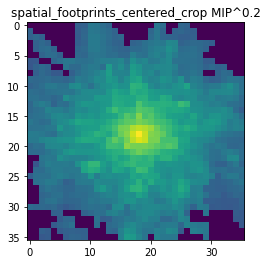

In [9]:
num_ROI = stat.shape[0]
print(f'Number of ROIs: {num_ROI}')

height = 512
width = 1024
spatial_footprints_centered = np.zeros((num_ROI, 241,241))
for i in range(num_ROI):
    spatial_footprints_centered[i , stat[i]['ypix'] - np.int16(stat[i]['med'][0]) + 120, stat[i]['xpix'] - np.int16(stat[i]['med'][1]) + 120] = stat[i]['lam'] # this is formatted for coding ease (dim1: y pix) (dim2: x pix) (dim3: ROI#)
spatial_footprints_centered_crop = spatial_footprints_centered[:, 102:138 , 102:138]

%matplotlib inline
plt.figure()
plt.imshow(np.max(spatial_footprints_centered_crop , axis=0) ** 0.2);
plt.title('spatial_footprints_centered_crop MIP^0.2');

images = spatial_footprints_centered_crop

In [10]:
F_new = F - 0.7*Fneu
F_baseline = np.percentile(F_new , 30 , axis=1)
dFoF = (F_new - F_baseline[:,None]) / F_baseline[:,None]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


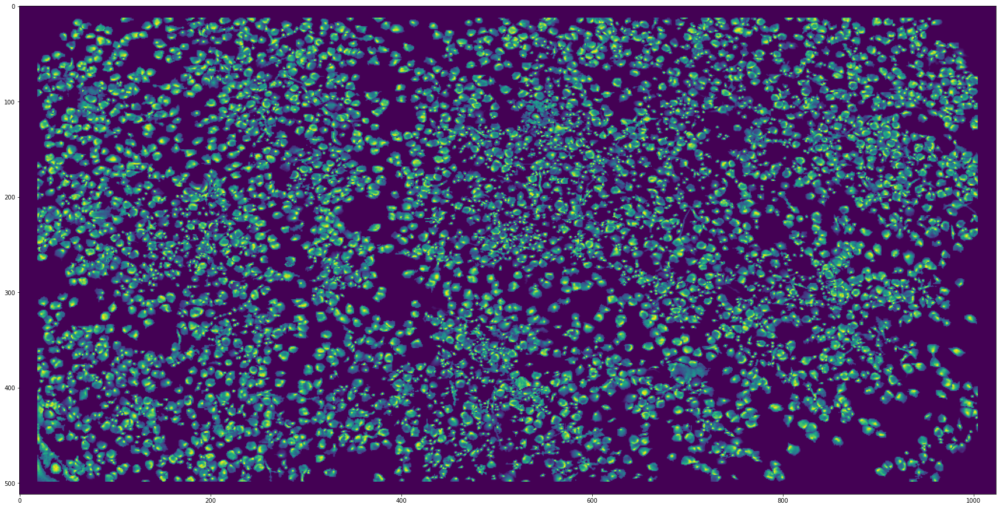

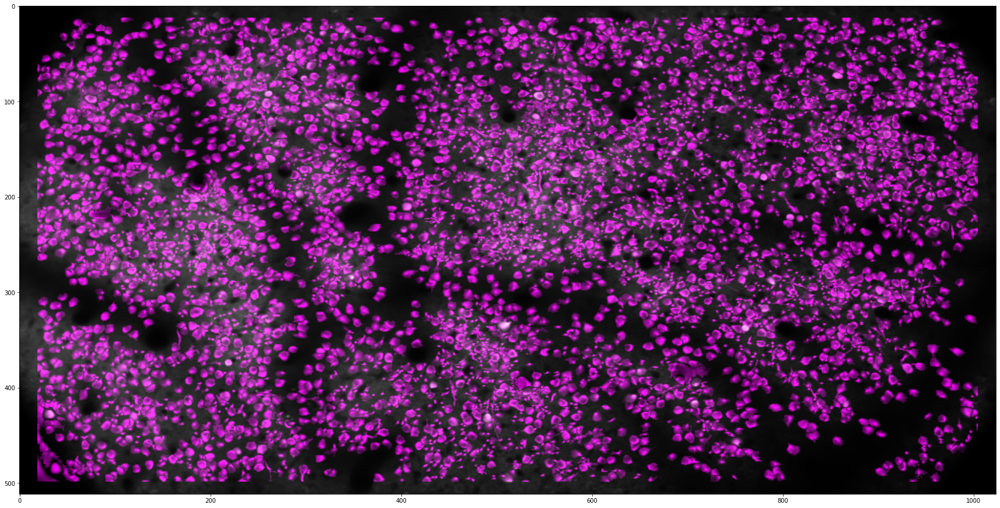

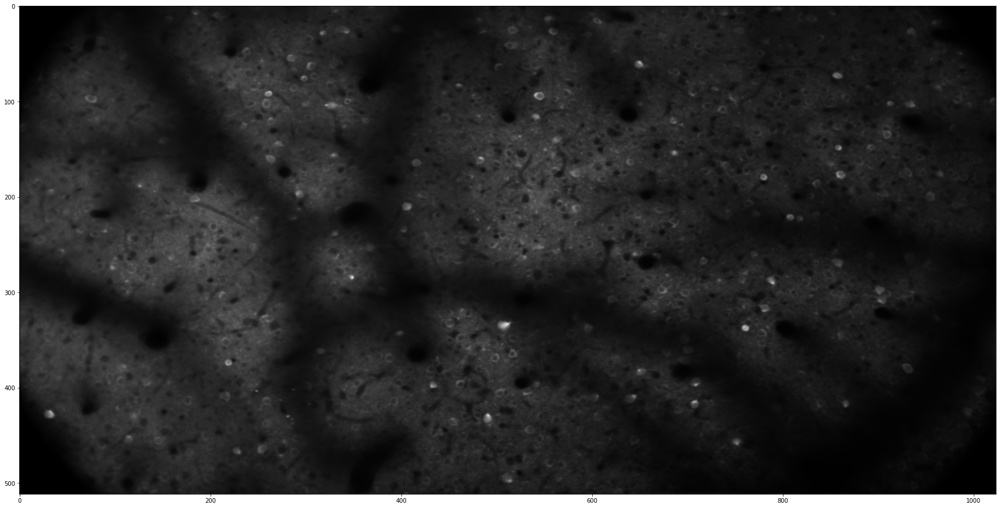

In [11]:
meanImg = ops[()]['meanImg']
frame_height = meanImg.shape[0]
frame_width = meanImg.shape[1]

masks_all_flat_norm = np.zeros_like(meanImg)
for ii in range(len(stat[()])):
    roi_current = stat[()][ii]['lam']
    masks_all_flat_norm[stat[()][ii]['ypix'] , stat[()][ii]['xpix']] = roi_current / np.max(roi_current)

plt.figure(figsize=(30,20))
plt.imshow(masks_all_flat_norm)

plt.figure(figsize=(30,20))
plt.imshow(np.concatenate((masks_all_flat_norm[...,None] + meanImg[...,None]/np.max(meanImg),
                           meanImg[...,None]/np.max(meanImg),
                           masks_all_flat_norm[...,None] + meanImg[...,None]/np.max(meanImg)) , axis=2))

plt.figure(figsize=(30,20))
plt.imshow(np.concatenate((meanImg[...,None]/np.max(meanImg) , meanImg[...,None]/np.max(meanImg) , meanImg[...,None]/np.max(meanImg)) , axis=2))


In [12]:
## Define model architecture
## DO NOT CHANGE ANYTHING HERE!!!
## This architecture is linked to the .pth parameters file

import torch
from torch.autograd import Variable
from torch.nn import Linear, ReLU, CrossEntropyLoss, Sequential, Conv2d, MaxPool2d, Module, Softmax, BatchNorm2d, Dropout, Sigmoid, SELU, GELU, PReLU, Softplus, Softmax2d
from torch.optim import Adam, SGD

In [13]:
dropout_prob = 0.0
momentum_val = 0.9

class Net(Module):   
    def __init__(self):
        super(Net, self).__init__()

        self.cnn_layers = Sequential(
            Conv2d(in_channels=1, out_channels=16, kernel_size=5, stride=1, padding=0),
#             Tanh(),
            ReLU(),
#             BatchNorm2d(6, momentum=momentum_val),
#             AvgPool2d(kernel_size=2),           
            
            Conv2d(in_channels=16, out_channels=16, kernel_size=5, stride=1, padding=0),
            MaxPool2d(kernel_size=2, stride=2),           
#             Tanh(),
            ReLU(),
#             BatchNorm2d(16, momentum=momentum_val),
            Dropout(dropout_prob*1),
            
            Conv2d(in_channels=16, out_channels=32, kernel_size=5, stride=1, padding=1),
            MaxPool2d(kernel_size=2, stride=2),           
#             Tanh(),
            ReLU(),
#             BatchNorm2d(16, momentum=momentum_val),
            Dropout(dropout_prob*1),

            Conv2d(in_channels=32, out_channels=64, kernel_size=5, stride=1, padding=0),
#             BatchNorm2d(16, momentum=momentum_val),
            MaxPool2d(kernel_size=2, stride=2),           
#             Tanh(),
            ReLU(),
            Dropout(dropout_prob*1),   
            
#             Conv2d(in_channels=24, out_channels=32, kernel_size=5, stride=1, padding=0),
#             Tanh(),
# #             ReLU(),
# #             MaxPool2d(kernel_size=2, stride=2),           
            
            
            
#             # Defining a 2D convolution layer
#             BatchNorm2d(1, momentum=momentum_val),
#             Conv2d(1, 8, kernel_size=5, stride=1, padding=1),
#             BatchNorm2d(8, momentum=momentum_val),
#             ReLU(),
# #             Dropout(dropout_prob*0.1),
#             MaxPool2d(kernel_size=2, stride=2),
            
#            # Defining a 2D convolution layer
#             Conv2d(8, 16, kernel_size=4, stride=1, padding=1),
#             BatchNorm2d(16, momentum=momentum_val),
#             ReLU(),
# #             Dropout(dropout_prob*0.1),
#             MaxPool2d(kernel_size=2, stride=2),
            
# #             # Defining another 2D convolution layer
#             Conv2d(16, 32, kernel_size=4, stride=1, padding=2),
# #             BatchNorm2d(64, momentum=momentum_val),
#             ReLU(),
# #             Dropout(dropout_prob*0.1),
# #             Softmax2d(),
#             MaxPool2d(kernel_size=2, stride=2),
            
# #             # Defining another 2D convolution layer
#             Conv2d(64, 64, kernel_size=4, stride=1, padding=2),
# #             BatchNorm2d(16, momentum=momentum_val),
#             SELU(),
# #             Dropout(dropout_prob*0.1),
# #             Softmax2d(),
#             MaxPool2d(kernel_size=2, stride=2),
            
#             # Defining another 2D convolution layer
#             Conv2d(256, 1024, kernel_size=4, stride=1, padding=4),
# #             BatchNorm2d(16, momentum=momentum_val),
#             ReLU(),
# #             Dropout(dropout_prob*0.1),
# #             Softmax2d(),
#             MaxPool2d(kernel_size=2, stride=2),
            
#             # Defining another 2D convolution layer
#             Conv2d(1024, 32, kernel_size=4, stride=1, padding=4),
# #             BatchNorm2d(16, momentum=momentum_val),
#             ReLU(),
# #             Dropout(dropout_prob*0.1),
# #             Softmax2d(),
#             MaxPool2d(kernel_size=2, stride=2),
            
#             # Defining another 2D convolution layer
#             Conv2d(64, 16, kernel_size=4, stride=1, padding=2),
# #             BatchNorm2d(16, momentum=momentum_val),
#             SELU(),
# #             Dropout(dropout_prob*0.1),
# #             Softmax2d(),
#             MaxPool2d(kernel_size=2, stride=2),

        )

        self.linear_layers = Sequential(
            Linear(in_features=64, out_features=256),
#             Tanh(),
            ReLU(),
            Dropout(dropout_prob*1),

#             Linear(in_features=256, out_features=64),
# #             Tanh(),
#             ReLU(),
#             Dropout(dropout_prob*1),
            
            Linear(in_features=256, out_features=6),
            
            
#             Linear(1296, 512),
# #             Dropout(dropout_prob * 1),
#             ReLU(),
#             Softmax(dim=0),
# #             Sigmoid(),
            
            
#             Linear(216, 512),
#             Dropout(dropout_prob * 1),
#             ReLU(),

#             Linear(512, 6),
# #             ReLU(),
# #             Softmax(dim=0),
        )

    # Defining the forward pass    
    def forward(self, x):
        x = self.cnn_layers(x)
#         if epoch%1000==0:
#             print(epoch)
#             print(x.shape)
# #         x = x.view(x.size(0), -1)
#         x = x.view(-1, x.size(1) * x.size(2) * x.size(3))
        x = torch.flatten(x, 1)
#         if epoch%1000==0:
#             print(epoch)
#             print(x.shape)
        x = self.linear_layers(x)
        return x 

In [14]:
#### ENTER FILENAME + PATH OF NETWORK .pth FILE

PATH_load_name_netParams = f'ROI_Classifier_pth_files{slash_type}ROI_Classifier_20201004{slash_type}Net_trainedOnAug_20201004_trainingSet_mouse628_20200903and20200815.pth'
# PATH_load_name_netParams = f'ROI_Classifier_20200928{slash_type}Net_trainedOnAug_20200928_trainingSet_mouse628_20200903and20200815.pth'
# PATH_load_dir_netParams = 'G:/My Drive/Research/Sabatini Lab Stuff - working/Code/PYTHON/ROI_Classifiers/'
PATH_absolute = pathlib.Path('.').absolute()
PATH_load_dir_netParams = f'{PATH_absolute}{slash_type}'

model = Net()
model.load_state_dict(torch.load(f'{PATH_load_dir_netParams}{PATH_load_name_netParams}'))
model.eval()

Net(
  (cnn_layers): Sequential(
    (0): Conv2d(1, 16, kernel_size=(5, 5), stride=(1, 1))
    (1): ReLU()
    (2): Conv2d(16, 16, kernel_size=(5, 5), stride=(1, 1))
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (4): ReLU()
    (5): Dropout(p=0.0, inplace=False)
    (6): Conv2d(16, 32, kernel_size=(5, 5), stride=(1, 1), padding=(1, 1))
    (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (8): ReLU()
    (9): Dropout(p=0.0, inplace=False)
    (10): Conv2d(32, 64, kernel_size=(5, 5), stride=(1, 1))
    (11): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (12): ReLU()
    (13): Dropout(p=0.0, inplace=False)
  )
  (linear_layers): Sequential(
    (0): Linear(in_features=64, out_features=256, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.0, inplace=False)
    (3): Linear(in_features=256, out_features=6, bias=True)
  )
)

In [15]:
input_x = torch.tensor(images[:,None,:,:]).type('torch.FloatTensor')

output = model(input_x).cpu().detach().numpy()
softmax = np.exp(output)
prob = softmax
predictions = np.argmax(list(prob), axis=1)


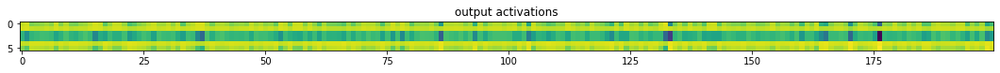

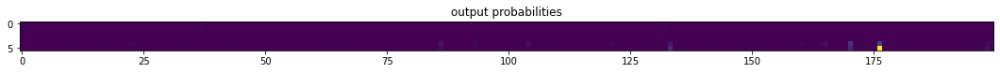

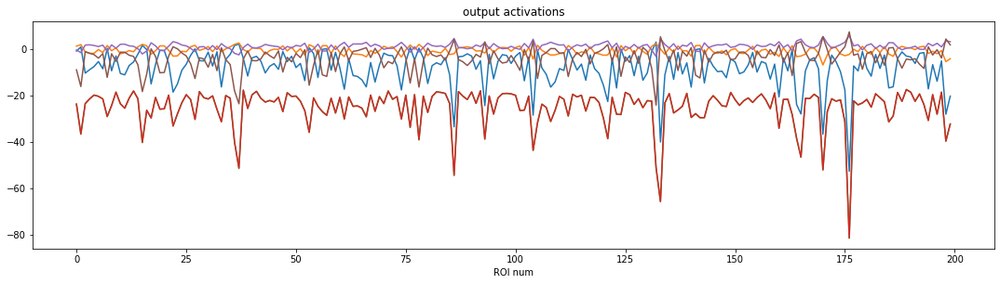

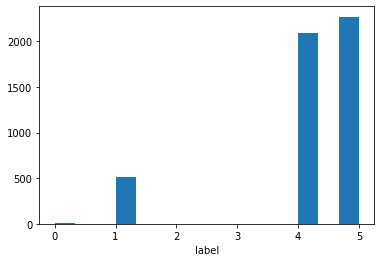

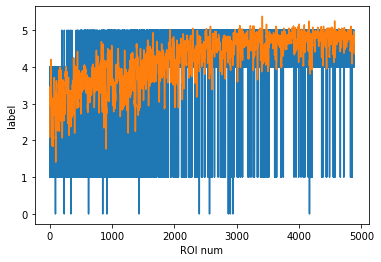

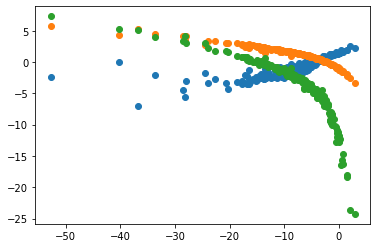

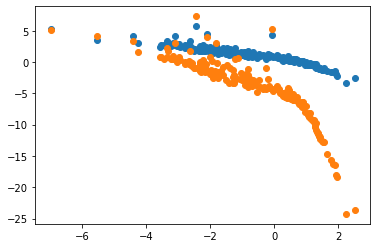

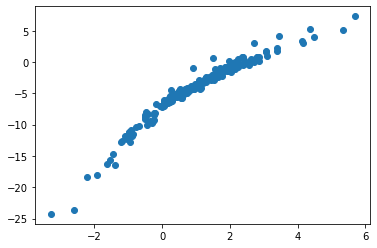

In [16]:
## Show some of the results

ind_to_plot =np.arange(100,300)

%matplotlib inline
fig_output = plt.figure()
plt.imshow(output[ind_to_plot,:].T);
plt.title('output activations');
fig_output.set_size_inches(18.5, 10.5)

fig_prob = plt.figure()
plt.imshow(prob[ind_to_plot,:].T);
plt.title('output probabilities');
fig_prob.set_size_inches(18.5, 10.5)

fig_prob_lines = plt.figure()
plt.plot(output[ind_to_plot,:])
plt.title('output activations');
plt.xlabel('ROI num')
fig_prob_lines.set_size_inches(18.5, 4.5)

fig_predHist = plt.figure()
plt.hist(predictions , 15);
plt.xlabel('label')

fig_predLines = plt.figure()
plt.plot(predictions);
plt.plot(scipy.signal.savgol_filter(predictions,19,3));
plt.xlabel('ROI num')
plt.ylabel('label')

fig_scatterGroups0 = plt.figure()
plt.scatter(output[ind_to_plot , np.array([0])] , output[ind_to_plot , np.array([1])])
plt.scatter(output[ind_to_plot , np.array([0])] , output[ind_to_plot , np.array([4])])
plt.scatter(output[ind_to_plot , np.array([0])] , output[ind_to_plot , np.array([5])])
fig_scatterGroups1 = plt.figure()
plt.scatter(output[ind_to_plot , np.array([1])] , output[ind_to_plot , np.array([4])])
plt.scatter(output[ind_to_plot , np.array([1])] , output[ind_to_plot , np.array([5])])
fig_scatterGroups4 = plt.figure()
plt.scatter(output[ind_to_plot , np.array([4])] , output[ind_to_plot , np.array([5])])

In [17]:
stat[1].keys()

dict_keys(['ypix', 'xpix', 'lam', 'footprint', 'mrs', 'mrs0', 'compact', 'med', 'npix', 'overlap', 'radius', 'aspect_ratio', 'npix_norm', 'skew', 'std'])

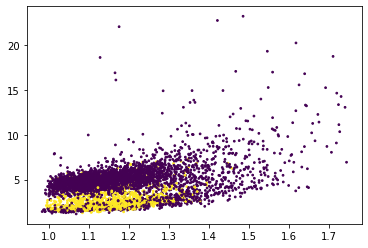

In [78]:
import sklearn as sk
import sklearn.cluster
## Define ROIs as cells or not
# I am finding that the intersection of a k-means on some stat params and the built in classifier probability is pretty good
num_cells = F.shape[0]
all_stat_keys = stat[1].keys()
all_stat_keys = np.array([*all_stat_keys])

# stat_keys_toUse = [3,4,5,6,8,9,10,11,13,14]
stat_keys_toUse = [8,10,11,13,14]
# stat_keys_toUse = [6,8,9,10,11, 13]

data_for_classifier = np.zeros((num_cells , len(stat_keys_toUse)))

for ii,val in enumerate(all_stat_keys[stat_keys_toUse]):
#     print(val)
#     print(ii)
    data_for_classifier[:,ii] = [stat[ii][val] for ii in range(len(stat))]


# data_for_classifier = np.hstack((data_for_classifier, iscell[:,1].reshape((iscell.shape[0],1))))

cluster_IDs = sk.cluster.KMeans(n_clusters=2, random_state=2637).fit(data_for_classifier).labels_

%matplotlib inline
h = plt.figure()
# plt.scatter(data_for_classifier[:,7], data_for_classifier[:,9], s=2, c=cluster_IDs)
# plt.scatter([stat[ii]['aspect_ratio'] for ii in range(num_cells)], [stat[ii]['radius'] for ii in range(num_cells)], s=3, c=cluster_IDs);
# plt.scatter([stat[ii]['aspect_ratio'] for ii in range(num_cells)], [stat[ii]['radius'] for ii in range(num_cells)], s=3, c=iscell[:,1] > 0.1);

is_cell_new = np.array(iscell[:,1] > 0.05) *  np.array(cluster_IDs == 0)
is_cleanROI_forPopulationAnalysis = np.array(iscell[:,1] > 0.05)

plt.scatter([stat[ii]['aspect_ratio'] for ii in range(num_cells)], 
            [stat[ii]['radius'] for ii in range(num_cells)], s=3, 
            c= is_cell_new);
#             c=cluster_IDs);
#             c=iscell[:,1] > 0.2);

In [79]:
data_for_classifier.shape
prob.shape

data_for_manifold = np.concatenate((output[:,np.array([0,1,4,5])] , data_for_classifier , iscell[:,1][:,None]) , axis=1)
# data_for_manifold = np.concatenate((prob[:,np.array([0,1,4,5])] , iscell[:,1][:,None]) , axis=1)
data_for_manifold.shape

(4885, 10)

In [80]:
from sklearn.manifold import TSNE, SpectralEmbedding, MDS, LocallyLinearEmbedding, Isomap

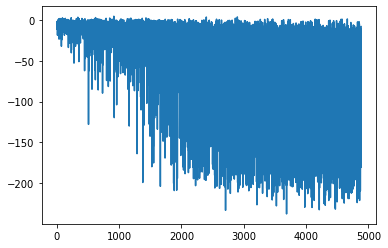

In [81]:
plt.figure()
plt.plot(output[:,0])

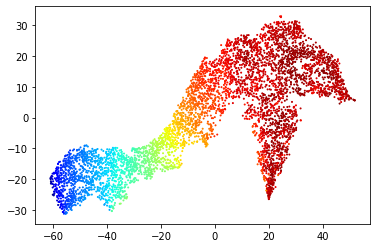

In [82]:
%matplotlib inline

# X_embedded = TSNE(n_components=2, perplexity=120).fit_transform(data_for_manifold[selector.ind,0:])
X_embedded = TSNE(n_components=2, perplexity=120).fit_transform(data_for_manifold[:,0:])

plt.figure()
# plt.scatter(X_embedded, np.zeros_like(X_embedded), c=output[:,0] , s=0.2, cmap='jet')
plt.scatter(X_embedded[:,0] , X_embedded[:,1], c=output[:,0] , s=1, cmap='jet')

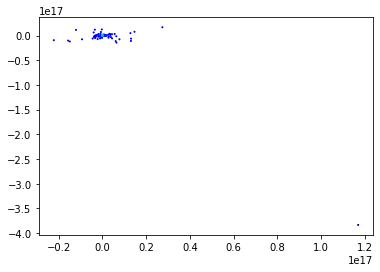

In [187]:
%matplotlib inline

X_embedded = MDS(n_components=2).fit_transform(data_for_manifold) 

plt.figure()
# plt.scatter(X_embedded, np.zeros_like(X_embedded), c=output[:,0] , s=0.2, cmap='jet')
plt.scatter(X_embedded[:,0] , X_embedded[:,1], c=output[:,0] , s=1, cmap='jet')

In [ ]:
X_embedded = Isomap(1000, n_components=2).fit_transform(data_for_manifold)
# X_embedded = MDS(n_components=2).fit_transform(prob) 

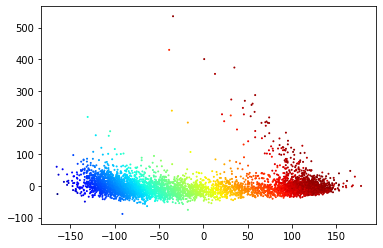

In [73]:
plt.figure()
# plt.scatter(X_embedded, np.zeros_like(X_embedded), c=output[:,0] , s=0.2, cmap='jet')
plt.scatter(X_embedded[:,0] , X_embedded[:,1], c=output[:,0] , s=1, cmap='jet')

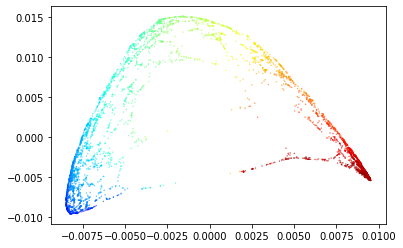

In [23]:
X_embedded2 = SpectralEmbedding(n_components=2, n_neighbors=5).fit_transform(data_for_manifold[:,:])
plt.figure()
plt.scatter(X_embedded2[:,0] , X_embedded2[:,1], c=output[:,0] , s=0.1, cmap='jet')
# plt.scatter(X_embedded, np.zeros_like(X_embedded), c=output[:,0] , s=0.1, cmap='jet')

In [25]:
## Find predictions of ROI_classifier

# import copy 
# prob2 = copy.deepcopy(prob)
# prob2[:,4] = prob2[:,4] / 6
# predictions2 = np.argmax(list(prob2), axis=1)
# plt.figure()
# plt.plot(np.log(prob2[:,:6]))

In [83]:
import numpy as np

from matplotlib.widgets import LassoSelector
from matplotlib.path import Path


class SelectFromCollection:
    """
    Select indices from a matplotlib collection using `LassoSelector`.

    Selected indices are saved in the `ind` attribute. This tool fades out the
    points that are not part of the selection (i.e., reduces their alpha
    values). If your collection has alpha < 1, this tool will permanently
    alter the alpha values.

    Note that this tool selects collection objects based on their *origins*
    (i.e., `offsets`).

    Parameters
    ----------
    ax : `~matplotlib.axes.Axes`
        Axes to interact with.
    collection : `matplotlib.collections.Collection` subclass
        Collection you want to select from.
    alpha_other : 0 <= float <= 1
        To highlight a selection, this tool sets all selected points to an
        alpha value of 1 and non-selected points to *alpha_other*.
    """

    def __init__(self, ax, collection, ind_toInclude, alpha_other=0.3):
        self.canvas = ax.figure.canvas
        self.collection = collection
        self.alpha_other = alpha_other

        self.xys = collection.get_offsets()
        self.Npts = len(self.xys)
        self.ind_toInclude = ind_toInclude
        
        # Ensure that we have separate colors for each object
        fig.canvas.draw()
        self.fc = collection.get_facecolors()
        if len(self.fc) == 0:
            raise ValueError('Collection must have a facecolor')
        elif len(self.fc) == 1:
            self.fc = np.tile(self.fc, (self.Npts, 1))

        self.lasso = LassoSelector(ax, onselect=self.onselect)
        self.ind = []

    def onselect(self, verts):
        path = Path(verts)
        self.ind = np.nonzero(path.contains_points(self.xys))[0]
        self.fc[:, -1] = self.alpha_other
        self.fc[self.ind, -1] = 1
        self.collection.set_facecolors(self.fc)
        self.canvas.draw_idle()
        plotMasks(self , ax2)
        fig.canvas.draw()

    def disconnect(self):
        self.lasso.disconnect_events()
        self.fc[:, -1] = 1
#         self.collection.set_facecolors(self.fc)
        self.canvas.draw_idle()

def plotMasks(selector , ax):
    toInc = selector.ind_toInclude[selector.ind]
    masks_all_selected = np.zeros((meanImg.shape[0] , meanImg.shape[1]))
#     for ii in selector.ind:
    for ii in toInc:
        masks_all_selected[stat[()][ii]['ypix'] , stat[()][ii]['xpix'] ] = stat[()][ii]['lam'] / np.max(stat[()][ii]['lam'])
#         masks_all_selected[stat[()][ii]['ypix'] , stat[()][ii]['xpix'] ] = stat[()][ii]['lam'] / np.max(stat[()][ii]['lam'])

    ax.imshow(masks_all_selected)

    print(f'Number of selected ROIs: {len(selector.ind)}')

In [85]:
%matplotlib qt
%matplotlib qt
%matplotlib qt

dot_size = 10

if __name__ == '__main__':

#     fig, ax = plt.subplots(nrows=2,ncols=1 , constrained_layout=True)
    fig = plt.figure(constrained_layout=True)
    gs = fig.add_gridspec(3, 1)
    ax1 = fig.add_subplot(gs[0])
    ax2 = fig.add_subplot(gs[1:3])

    pts = ax1.scatter(X_embedded[:,0] , X_embedded[:,1] , s=dot_size , c=output[:,0] , cmap='jet')
    ind_toInclude = np.arange(X_embedded.shape[0])
    selector = SelectFromCollection(ax1, pts, ind_toInclude)

    def keypress(event):
        if event.key == "enter":
            selector.disconnect()
            fig.canvas.draw()
        if event.key == "shift":
            plotMasks(selector , ax2)
            fig.canvas.draw()
        if event.key == "control":
            ax1.clear()
            pts = ax1.scatter(X_embedded[:,0] , X_embedded[:,1] , s=dot_size , c=output[:,0] , cmap='jet')
            fig.canvas.draw()
            ind_toInclude = np.arange(X_embedded.shape[0])
            selector.__init__(ax1, pts, ind_toInclude)
    def subselect(threshold):
        ind_toInclude = np.where(output[:,0] > threshold)[0]
        print(f'Number of ROIs above threshold: {len(ind_toInclude)}')
        ax1.clear()
        pts = ax1.scatter(X_embedded[ind_toInclude,0] , X_embedded[ind_toInclude,1] , s=dot_size , c=output[ind_toInclude,0] , cmap='jet')
        fig.canvas.draw()
#         selector = SelectFromCollection(ax1, pts)
        selector.__init__(ax1, pts, ind_toInclude)


    
    fig.canvas.mpl_connect("key_press_event", keypress)
    ax1.set_title("Press enter to accept selected points.")
    plt.show()
    
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets

interact(subselect, threshold=widgets.IntSlider(min=np.min(output[:,0]), max=30, step=1, value=np.min(output[:,0])));

interactive(children=(IntSlider(value=-237, description='threshold', max=30, min=-237), Output()), _dom_classe…

Number of ROIs selected: 1027


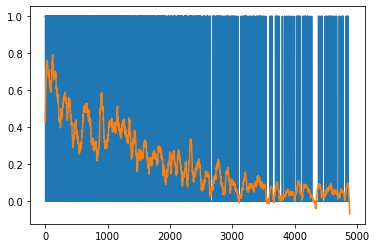

In [87]:
selected_ROIs = selector.ind_toInclude[selector.ind]
selected_ROIs_bool = np.in1d(np.arange(len(stat)) , selected_ROIs)
print(f'Number of ROIs selected: {len(selected_ROIs)}')

%matplotlib inline
plt.figure()
plt.plot(selected_ROIs_bool)
plt.plot(scipy.signal.savgol_filter(selected_ROIs_bool, 101, 3))

In [88]:
footprints_tall = np.zeros((frame_height*frame_width,4))*np.nan
cc = 0
for ii in range(len(stat)):
    num_pixels = len(stat[()][ii]['ypix'])
    footprints_tall[cc:cc+num_pixels,0] = np.ones(num_pixels)*ii
    footprints_tall[cc:cc+num_pixels,1] = stat[()][ii]['ypix']
    footprints_tall[cc:cc+num_pixels,2] = stat[()][ii]['xpix']
    footprints_tall[cc:cc+num_pixels,3] = stat[()][ii]['lam']
    cc = cc+num_pixels
footprints_tall = footprints_tall[~np.isnan(footprints_tall[:,0]),:]
# footprints_tall
# plt.figure()
# plt.plot(footprints_tall[:,3])

In [89]:
## USE iscell (OPTIONAL)

# toInclude = iscell[:,0]
toInclude = selected_ROIs_bool
toExclude = toInclude==0

In [90]:
toExclude_manuallyClicked = np.zeros_like(toInclude)
toInclude_manuallyClicked = np.zeros_like(toInclude)

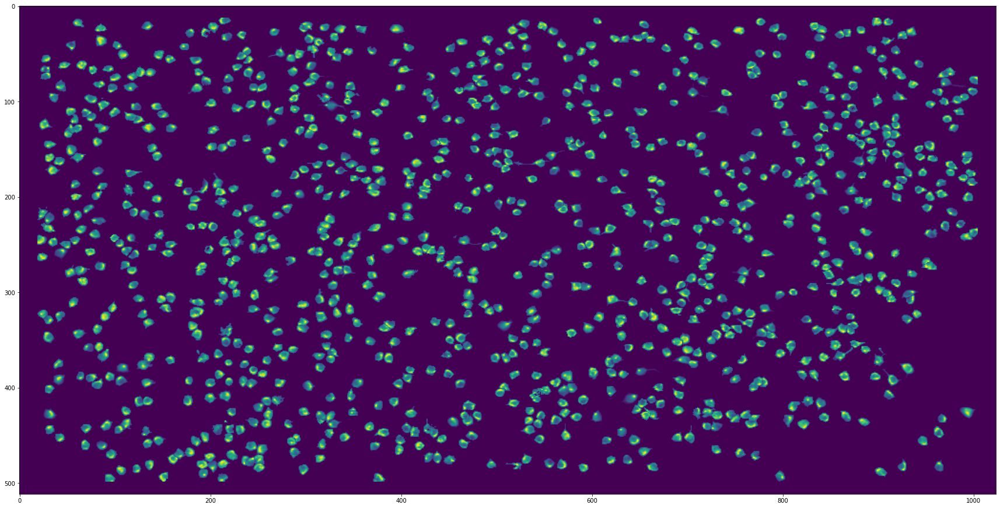

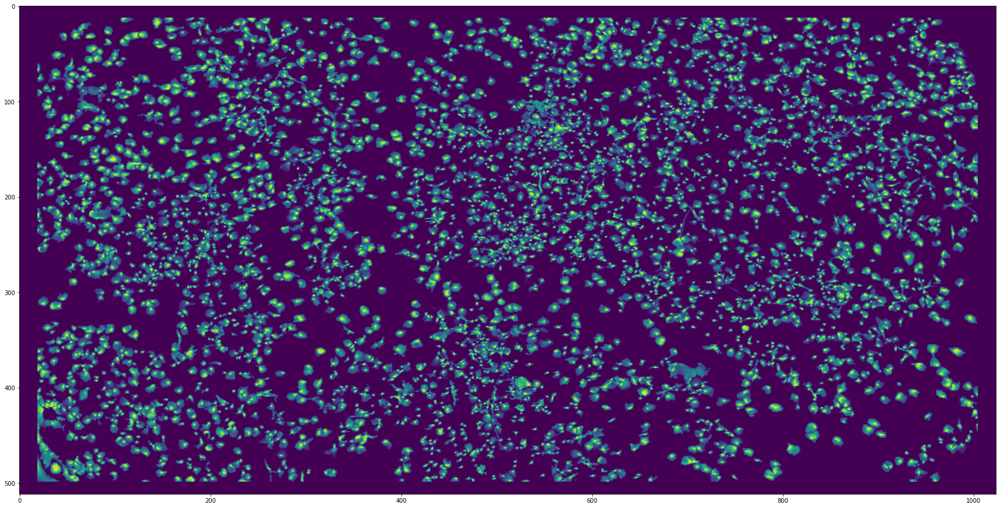

In [91]:
## Look at all the cells at once
%matplotlib inline

masks_toInclude = np.zeros((meanImg.shape[0] , meanImg.shape[1]))
masks_toExclude = np.zeros((meanImg.shape[0] , meanImg.shape[1]))
for ii in np.where(np.uint8(toInclude) - toExclude_manuallyClicked)[0]:
    masks_toInclude[stat[()][ii]['ypix'] , stat[()][ii]['xpix']] = stat[()][ii]['lam'] / np.max(stat[()][ii]['lam'])
for ii in np.where(np.uint8(toExclude) - toInclude_manuallyClicked)[0]:
    masks_toExclude[stat[()][ii]['ypix'] , stat[()][ii]['xpix']] = stat[()][ii]['lam'] / np.max(stat[()][ii]['lam'])
#         masks_all_classified[stat[()][ii]['ypix'] , stat[()][ii]['xpix'] , jj] = stat[()][ii]['lam'] / (np.max(stat[()][ii]['lam'])**2)
#         masks_all_classified[stat[()][ii]['ypix'] , stat[()][ii]['xpix'] , jj] = stat[()][ii]['lam']
plt.figure(figsize=(30,20))
plt.imshow(masks_toInclude)
plt.figure(figsize=(30,20))
plt.imshow(masks_toExclude)

In [92]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.backend_bases import MouseButton
from scipy.integrate import trapz
from matplotlib import animation
%matplotlib qt
%matplotlib qt

def find_nearest(array,value):
    idx = (np.abs(array-value)).argmin()
    return array[idx]

def append_ROI_toExclude(coords):
    global toExclude_manuallyClicked
    global footprints_tall
    pixel_match_bool = (footprints_tall[:,1] == np.round(coords[-1][1])) * (footprints_tall[:,2] == np.round(coords[-1][0]))
    check_found_single_ROI = sum(pixel_match_bool)
    if check_found_single_ROI:
        ROI_toExclude = int(footprints_tall[np.where(pixel_match_bool)[0][0] , 0])
        print(f'Excluding ROI#: {ROI_toExclude}')
        if ROI_toExclude in np.where(toInclude)[0]:
            toExclude_manuallyClicked[ROI_toExclude] = 1
    
# Simple mouse click function to store coordinates
def onclick(event):
    if event.button is MouseButton.LEFT:

        global ix, iy
        ix, iy = event.xdata, event.ydata
#         print(event)

        # print 'x = %d, y = %d'%(
        #     ix, iy)

        # assign global variable to access outside of function
        global coords
        coords.append((ix, iy))
        
        append_ROI_toExclude(coords)
        update_image()
        return

def update_image():
    masks_toInclude = np.zeros((meanImg.shape[0] , meanImg.shape[1]))
    for ii in np.where(np.uint8(toInclude) - toExclude_manuallyClicked)[0]:
        masks_toInclude[stat[()][ii]['ypix'] , stat[()][ii]['xpix']] = stat[()][ii]['lam'] / np.max(stat[()][ii]['lam'])
    ax1.clear()
    im = ax1.imshow(masks_toInclude)
    plt.draw()
    

fig, (ax1) = plt.subplots(1, 1, figsize=(30,20))
im = ax1.imshow(masks_toInclude)
plt.show(block=False)
# ani = animation.FuncAnimation(fig, update_image, interval=0)

plt.pause(2) 
            
coords = []

# Call click func
cid = fig.canvas.mpl_connect('button_press_event', onclick)

# plt.show(1)

Excluding ROI#: 2313
Excluding ROI#: 4777
Excluding ROI#: 810
Excluding ROI#: 810
Excluding ROI#: 810
Excluding ROI#: 4759
Excluding ROI#: 2493
Excluding ROI#: 3403
Excluding ROI#: 2805
Excluding ROI#: 2070
Excluding ROI#: 2838
Excluding ROI#: 2838
Excluding ROI#: 2838
Excluding ROI#: 2838
Excluding ROI#: 3869
Excluding ROI#: 718
Excluding ROI#: 483
Excluding ROI#: 1816
Excluding ROI#: 2095
Excluding ROI#: 4385
Excluding ROI#: 3804
Excluding ROI#: 522
Excluding ROI#: 2473
Excluding ROI#: 1280
Excluding ROI#: 930
Excluding ROI#: 1588
Excluding ROI#: 4509
Excluding ROI#: 2
Excluding ROI#: 844
Excluding ROI#: 2570
Excluding ROI#: 1667
Excluding ROI#: 169
Excluding ROI#: 181
Excluding ROI#: 3964
Excluding ROI#: 2603
Excluding ROI#: 2463
Excluding ROI#: 2310
Excluding ROI#: 4589
Excluding ROI#: 626
Excluding ROI#: 167
Excluding ROI#: 1558
Excluding ROI#: 2266
Excluding ROI#: 81
Excluding ROI#: 1820
Excluding ROI#: 2924
Excluding ROI#: 2315
Excluding ROI#: 2195
Excluding ROI#: 1128
Excluding

In [93]:
fig.canvas.mpl_disconnect(cid)

In [94]:
np.sum(toExclude_manuallyClicked)

56

Final number of included ROIs:  971
Final number of NOT included ROIs:  3914


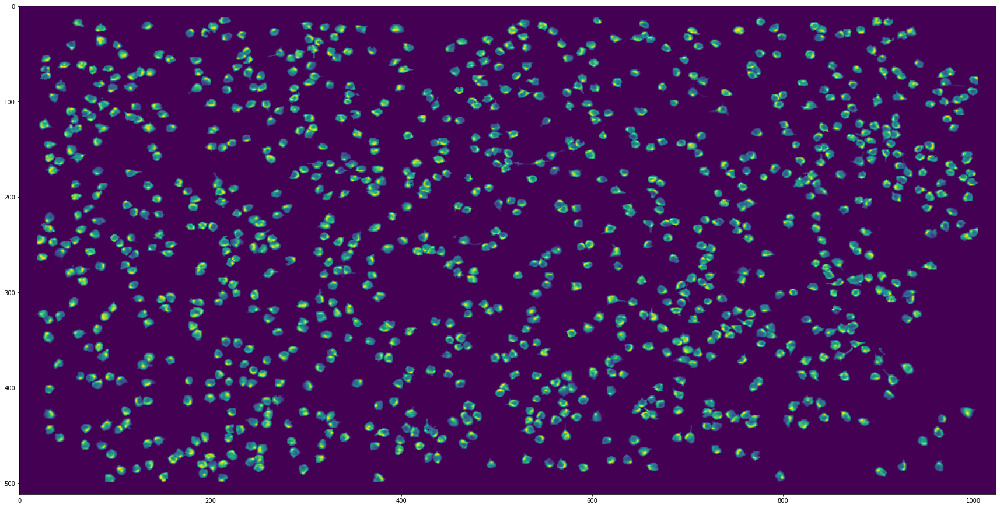

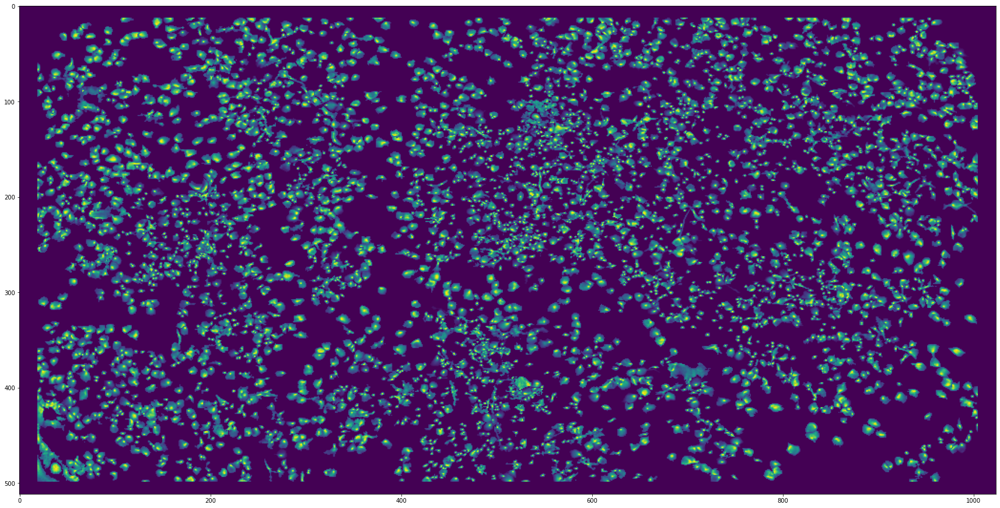

In [95]:
toInclude_final = np.uint8(toInclude) - toExclude_manuallyClicked
print(f'Final number of included ROIs:  {np.sum(toInclude_final)}')
print(f'Final number of NOT included ROIs:  {np.sum(1-toInclude_final)}')

## Look at all the cells at once
%matplotlib inline

masks_toInclude = np.zeros((meanImg.shape[0] , meanImg.shape[1]))
masks_notToInclude = np.zeros((meanImg.shape[0] , meanImg.shape[1]))
for ii in np.where(toInclude_final)[0]:
    masks_toInclude[stat[()][ii]['ypix'] , stat[()][ii]['xpix']] = stat[()][ii]['lam'] / np.max(stat[()][ii]['lam'])
for ii in np.where(1-toInclude_final)[0]:
    masks_notToInclude[stat[()][ii]['ypix'] , stat[()][ii]['xpix']] = stat[()][ii]['lam'] / np.max(stat[()][ii]['lam'])

plt.figure(figsize=(30,20))
plt.imshow(masks_toInclude)
plt.figure(figsize=(30,20))
plt.imshow(masks_notToInclude)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


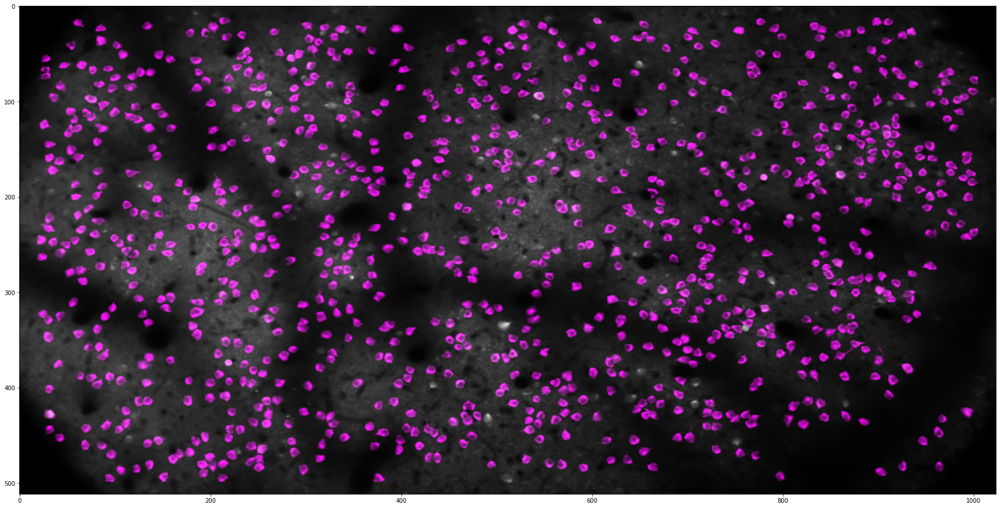

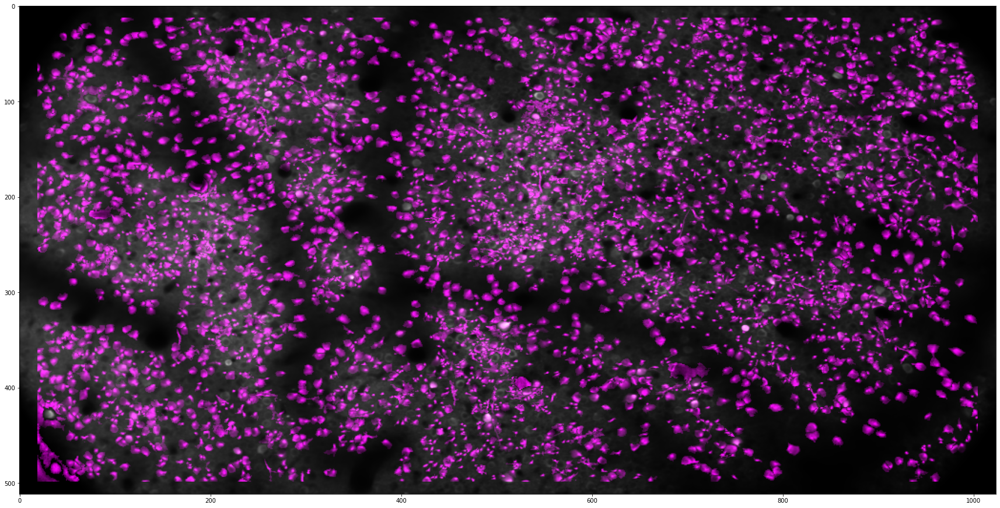

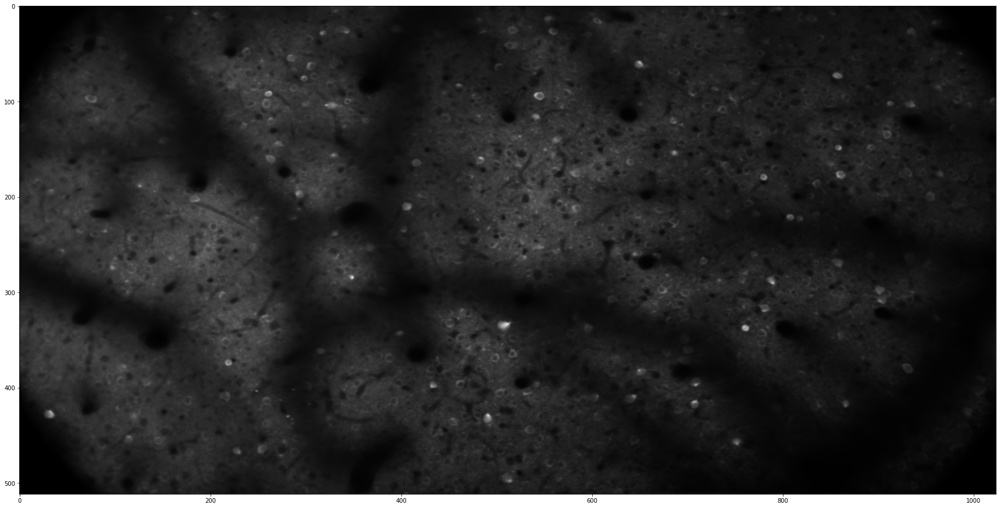

In [96]:
plt.figure(figsize=(30,20))
plt.imshow(np.concatenate((masks_toInclude[...,None] + meanImg[...,None]/np.max(meanImg),
                           meanImg[...,None]/np.max(meanImg),
                           masks_toInclude[...,None] + meanImg[...,None]/np.max(meanImg)) , axis=2))
plt.figure(figsize=(30,20))
plt.imshow(np.concatenate((masks_notToInclude[...,None] + meanImg[...,None]/np.max(meanImg),
                           meanImg[...,None]/np.max(meanImg),
                           masks_notToInclude[...,None] + meanImg[...,None]/np.max(meanImg)) , axis=2))

plt.figure(figsize=(30,20))
plt.imshow(np.concatenate((meanImg[...,None]/np.max(meanImg) , meanImg[...,None]/np.max(meanImg) , meanImg[...,None]/np.max(meanImg)) , axis=2))


In [97]:
# manual curation variables:
manual_selection_vars = dict([
    ('toInclude_preExclusion', toInclude), 
    ('toExclude_manuallyClicked', toExclude_manuallyClicked), 
    ('predictions', predictions),
    ('output_activations', output),
    ('prob', prob),
    ('toInclude_final', toInclude_final)
    ])

In [98]:
save_dir = r'D:\RH_local\data\scanimage data\round 5 experiments\mouse 2_6\20210411\analysis_lastNight'

save_name = f'IsCell_ROIClassifier'
save_fullPath = f'{save_dir}/{save_name}.npy'
np.save(save_fullPath , toInclude_final)

save_name = f'manual_selection_vars'
save_fullPath = f'{save_dir}/{save_name}.npy'
np.save(save_fullPath , manual_selection_vars)